# SAE2 : Communes bretonnes

In [1]:
# Utilisons notre GPU - Attention :  Activer seulement et seulement si CUDA est disponible sinon un problème peut arrivé 
%env NETWORKX_AUTOMATIC_BACKENDS=cugraph

env: NETWORKX_AUTOMATIC_BACKENDS=cugraph


In [4]:
# importation des packages nécessaires
import numpy as np
import pandas as pd
import seaborn as sns
import ast as ast
from geopy.distance import geodesic
import scipy.stats as sps
import networkx as nx
import matplotlib.pyplot as plt
from queue import Queue


%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"] = (20,15)

## Le but de ce fichier est construire un graphe networkx à partir de données géolocalisée csv

### 1. Traitement des données csv :

In [5]:
# importation du fichier csv comme un panda dataframe
communes=pd.read_csv("./DonneesFourniesGraphes/voisinageCommunesBretonnes.csv", sep=';')

#on affiche les premières lignes du fichier
communes.head()



,insee,nom,nb_voisins,insee_voisins
0,22001,Allineuc,5,22203|22203|22384|22149|22009
1,22002,Andel,5,22093|22093|22044|22093|22093
2,22003,Aucaleuc,4,22259|22364|22388|22048
3,22004,Bégard,7,22041|22018|22310|22164|22135|22245|22254
4,22005,Belle-Isle-en-Terre,5,22135|22216|22129|22228|22359


In [6]:
communes.columns


Index(['insee', 'nom', 'nb_voisins', 'insee_voisins'], dtype='object')

In [7]:
# adaptation du format des données en liste des voisins (exemple)
print(communes['insee_voisins'][0])

print(communes.iloc[0,3])

[int(num) for num in communes['insee_voisins'][0].split('|')]


22203|22203|22384|22149|22009
22203|22203|22384|22149|22009


[22203, 22203, 22384, 22149, 22009]

In [8]:
#on enlève les voisins non bretons (22+29+35+56) et les boucles

def amezek(com):
    voisins = [int(num) for num in communes['insee_voisins'][com].split('|')]
    amezek = []
    for vois in voisins :
        if (22000 <= vois and vois<23000) or (29000 <= vois and vois<30000) or (35000 <= vois and vois<36000) or (56000 <= vois and vois<57000) : #on reste en bretagne
            if vois != communes['insee'][com] : # boucle
                if vois not in amezek: # ajout personnel pour éviter les doublons et/ou valeurs à null
                    amezek.append(vois)
    return amezek


for x in range(len(communes['insee'])) : 
    amezek(x)

In [9]:
# Création d'un dictionaire représentant la liste des voisins, structure proche des graphes networkx

voisins_dict = {communes['insee'][x] : amezek(x) for x in range(len(communes['insee']))}
voisins_dict[29021]


[29064, 29198, 29091]

### 2. Création d'un graphe en format networkx

In [10]:
#creation directe via l'outil networkx
G = nx.from_dict_of_lists(voisins_dict)

print(len(G.nodes))
#for node in G.nodes:
#    print(node)
    

1197


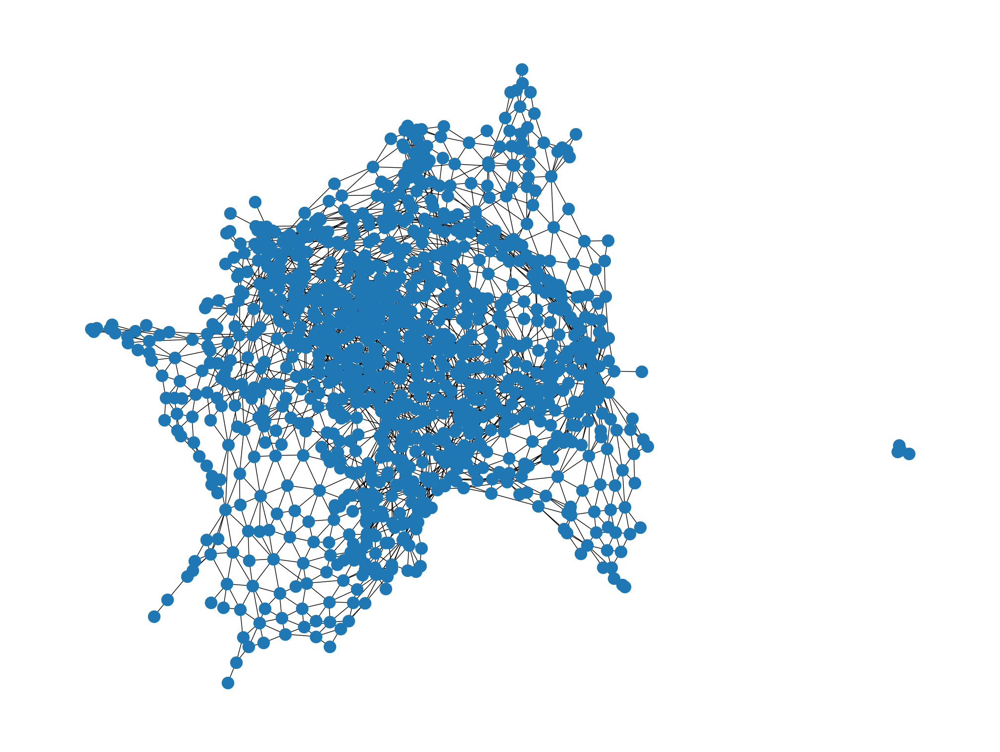

In [11]:
#pour l'instant les sommets ne sont pas placés géographiquement
nx.draw(G,pos=nx.spring_layout(G))


### 3 Exploitation des données géographiques

In [12]:
#lecture des informations geographique

geo=pd.read_csv("./DonneesFourniesGraphes/communes-geo.csv", sep=';')

geo.head()
geo_lite = geo.iloc[:,[0,1,17,19]]

geo_lite.columns

geo_lite['Geo Point'][0]

'47.965835834555435, -2.180339647082372'

In [13]:
# adaptation du format des données de géolocalisation (exemple)
ast.literal_eval(geo_lite['Geo Point'][0])

# création de la colone Latitude
geo_lite['Latitude']=geo_lite['Geo Point'].apply(lambda x : ast.literal_eval(x)[0])
# création de la colone Longitude
geo_lite['Longitude']=geo_lite['Geo Point'].apply(lambda x : ast.literal_eval(x)[1])

geo_lite.head()

,Geo Point,Geo Shape,Code Officiel Commune,Nom Officiel Commune,Latitude,Longitude
0,"47.965835834555435, -2.180339647082372","{""coordinates"": [[[-2.138393408174076, 47.9796...",56012,Beignon,47.965836,-2.180340
1,"48.13658848473797, -3.604143385699294","{""coordinates"": [[[-3.598896445577899, 48.0809...",56066,Gourin,48.136588,-3.604143
2,"47.66115932253269, -2.8979142904691706","{""coordinates"": [[[-2.914167012351387, 47.6298...",56167,Plougoumelen,47.661159,-2.897914
3,"47.8257861710007, -2.623531946315434","{""coordinates"": [[[-2.559861319644625, 47.7984...",56172,Plumelec,47.825786,-2.623532
4,"48.561815546029436, -2.3352456790830622","{""coordinates"": [[[-2.340377140698437, 48.5296...",22268,Ruca,48.561816,-2.335246


##### ajout des données géographique

In [14]:
# proposition de dictionaire de position pour le tracé en networkx

def pos_insee(G,data):
    pos = {} #dictionnaire vide
    for com in G.nodes:
        y = float(data[data['Code Officiel Commune'] == com]['Latitude'].iloc[0])
        x = float(data[data['Code Officiel Commune'] == com]['Longitude'].iloc[0])
        #on peut adapter les coordonnées
        #x=(x- 48.13380133652042)*1000
        #y=(y+2.287539276431153)*1000
    
        pos[com]=[x,y]
    
    return pos


pos_insee = pos_insee(G,geo_lite)
#print(pos_insee)

print(len(G.nodes)==len(pos_insee))

print(pos_insee[56167])

True
[-2.8979142904691706, 47.66115932253269]


In [15]:
# proposition de dictionaire de label pour le tracé en networkx

def label_insee(G,data):
    label = {} #dictionnaire vide
    for com in G.nodes:
        lab = data[data['Code Officiel Commune'] == com]['Nom Officiel Commune'].iloc[0]
    
        label[com]=lab
    
    return label

label_insee = label_insee(G,geo_lite)
label_insee

{22001: 'Allineuc',
 22002: 'Andel',
 22003: 'Aucaleuc',
 22004: 'Bégard',
 22005: 'Belle-Isle-en-Terre',
 22006: 'Berhet',
 22055: 'Binic-Étables-sur-Mer',
 22008: 'Bobital',
 22009: 'Le Bodéo',
 22011: 'Boqueho',
 22012: 'La Bouillie',
 22013: 'Bourbriac',
 22014: 'Bourseul',
 22015: 'Bréhand',
 22018: 'Brélidy',
 22019: 'Bringolo',
 22020: 'Broons',
 22021: 'Brusvily',
 22023: 'Bulat-Pestivien',
 22024: 'Calanhel',
 22025: 'Callac',
 22026: 'Calorguen',
 22027: 'Le Cambout',
 22028: 'Camlez',
 22029: 'Canihuel',
 22030: 'Caouënnec-Lanvézéac',
 22031: 'Carnoët',
 22032: 'Caulnes',
 22033: 'Caurel',
 22034: 'Cavan',
 22035: 'Les Champs-Géraux',
 22036: 'La Chapelle-Blanche',
 22037: 'La Chapelle-Neuve',
 22206: 'Châtelaudren-Plouagat',
 22039: 'La Chèze',
 22040: 'Coadout',
 22041: 'Coatascorn',
 22042: 'Coatréven',
 22043: 'Coëtlogon',
 22044: 'Coëtmieux',
 22045: 'Cohiniac',
 22046: 'Le Mené',
 22047: 'Corlay',
 22048: 'Corseul',
 22049: 'Créhen',
 22050: 'Dinan',
 22084: 'Jugon-les

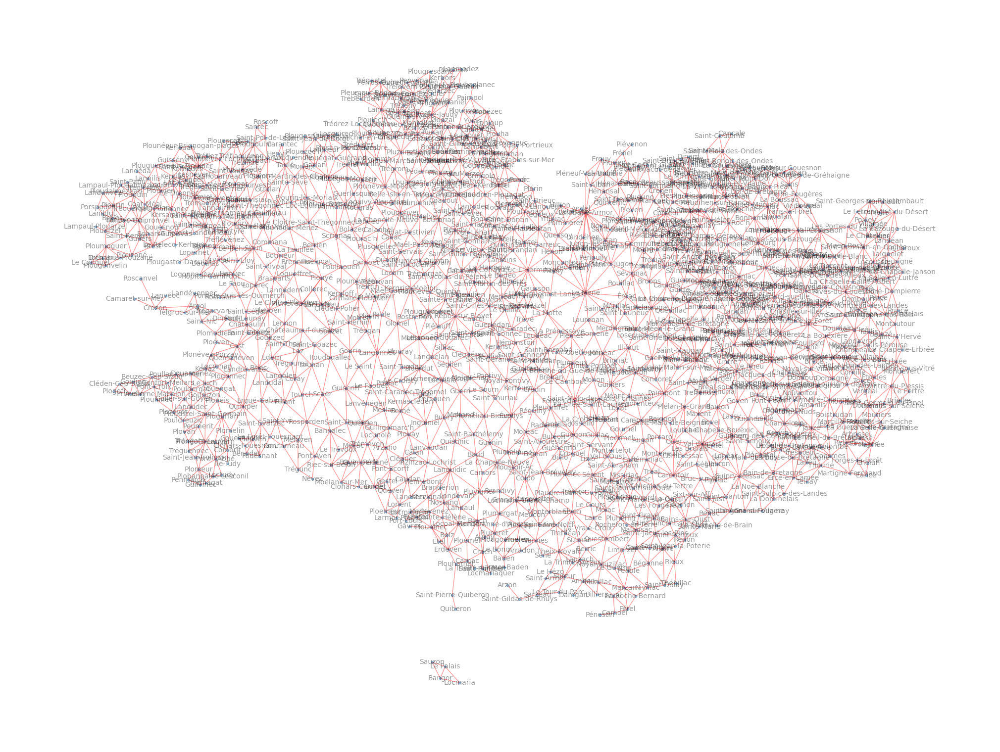

In [16]:
nx.draw(G,pos=pos_insee,node_size=10, alpha=0.4, edge_color="r", font_size=10, labels=label_insee)

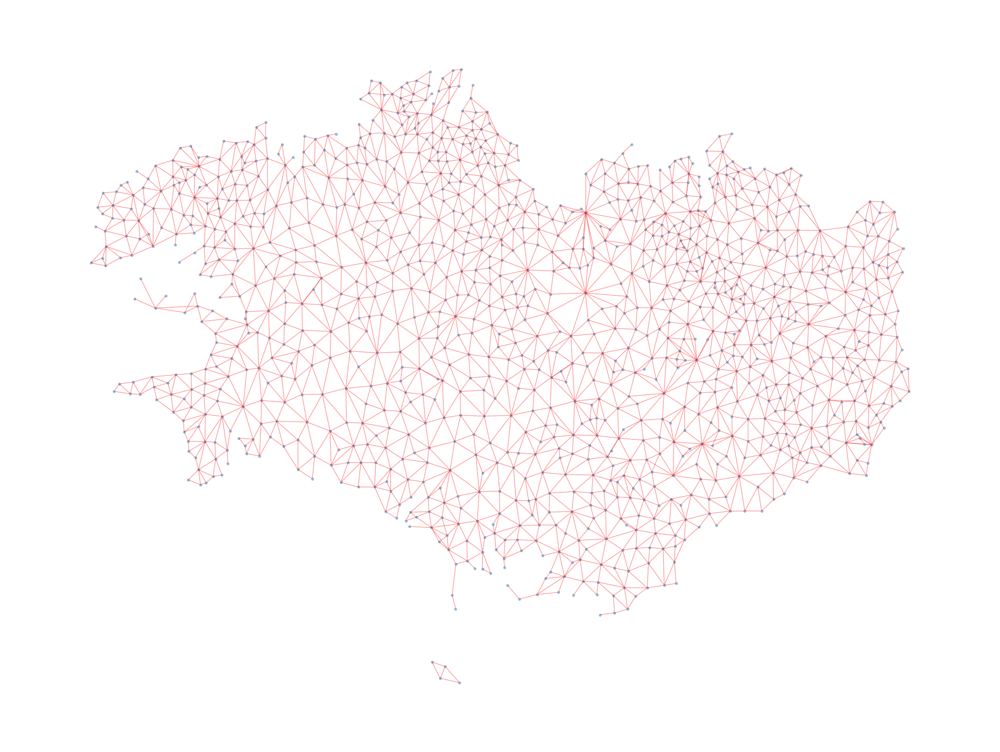

In [17]:
G.remove_edges_from(list(nx.selfloop_edges(G)))
nx.draw(G,pos=pos_insee,node_size=10, alpha=0.4, edge_color="r", font_size=16, with_labels=False)

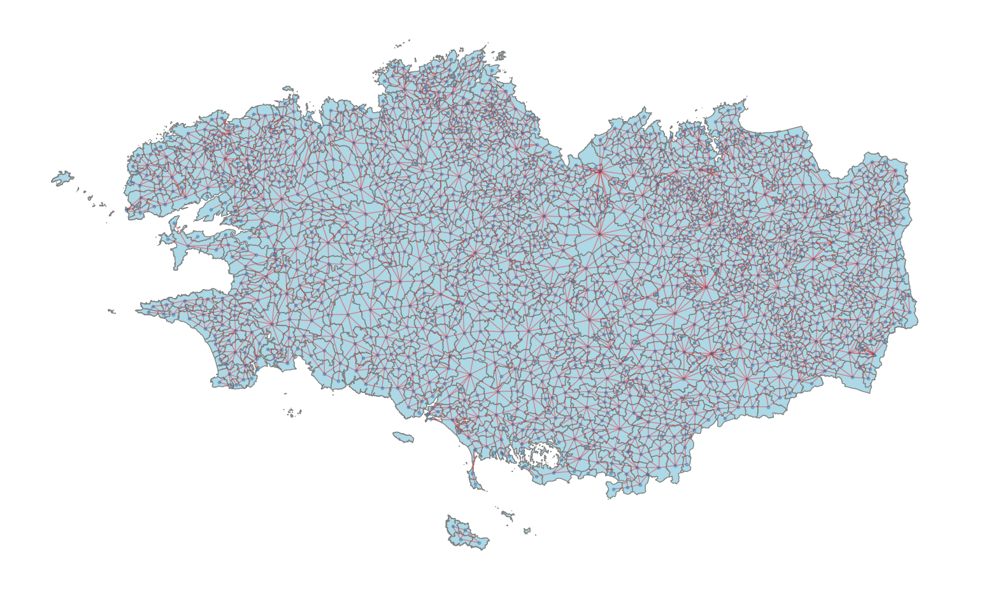

In [18]:
#on peut également utiliser des fonds de carte (via le format geojson par exemple)

import geopandas
region = geopandas.read_file("./DonneesFourniesGraphes/communes-geo.geojson")


plt.close()
# plot with a nice basemap
ax = region.plot(linewidth=1, edgecolor="grey", facecolor="lightblue")
ax.axis("off")
nx.draw(G, pos=pos_insee, ax=ax,node_size=10, alpha=0.4, edge_color="r")
plt.show()

### 4. Méthodes de calcul proposées

In [19]:
def calculate_degrees(G: nx.Graph) -> dict:
    """
    Permet de calculer le degré de l'ensemble des sommets d'un graphe 
    :param G: un graphe NetworkX
    :returns: un dictionnaire associant un sommet à son degré pour l'ensemble des sommets du graphe
    """
    degrees = dict()
    # Création de la liste des voisins pour chaque sommet du graphe
    voisins_dict = {communes['insee'][x] : amezek(x) for x in range(len(communes['insee']))}
    for sommet in G.nodes():
        # Le nombre de degrés d'un graphe est égal au nombre de voisins de celui-ci
        degrees[sommet] = len(voisins_dict[sommet])
    return degrees

# Exemple
degrees = calculate_degrees(G)

for sommet, ecc in degrees.items():
    print("Degrés de " + str(sommet) + " : " + str(ecc))

Degrés de 22001 : 4
Degrés de 22002 : 2
Degrés de 22003 : 4
Degrés de 22004 : 7
Degrés de 22005 : 5
Degrés de 22006 : 4
Degrés de 22055 : 3
Degrés de 22008 : 5
Degrés de 22009 : 6
Degrés de 22011 : 7
Degrés de 22012 : 5
Degrés de 22013 : 9
Degrés de 22014 : 6
Degrés de 22015 : 7
Degrés de 22018 : 6
Degrés de 22019 : 6
Degrés de 22020 : 6
Degrés de 22021 : 7
Degrés de 22023 : 5
Degrés de 22024 : 5
Degrés de 22025 : 7
Degrés de 22026 : 7
Degrés de 22027 : 4
Degrés de 22028 : 7
Degrés de 22029 : 8
Degrés de 22030 : 5
Degrés de 22031 : 10
Degrés de 22032 : 8
Degrés de 22033 : 5
Degrés de 22034 : 7
Degrés de 22035 : 5
Degrés de 22036 : 5
Degrés de 22037 : 5
Degrés de 22206 : 6
Degrés de 22039 : 4
Degrés de 22040 : 5
Degrés de 22041 : 4
Degrés de 22042 : 6
Degrés de 22043 : 5
Degrés de 22044 : 4
Degrés de 22045 : 5
Degrés de 22046 : 2
Degrés de 22047 : 5
Degrés de 22048 : 11
Degrés de 22049 : 6
Degrés de 22050 : 4
Degrés de 22084 : 9
Degrés de 22052 : 5
Degrés de 22053 : 6
Degrés de 22054 : 

In [21]:
def calculate_eccentricity1(G: nx.Graph) -> dict:
    """
    Permet de calculer l'eccentricité de l'ensemble des sommets d'un graphe avec l'algorithme de dijkstra programmé par NetworkX
    :param G: un graphe NetworkX
    :returns: un dictionnaire associant un sommet à son eccentricité pour l'ensemble des sommets du graphe
    """
    eccentricities = dict()
    for sommet in G.nodes():
        try:
            # Calcule de la longueur du chemin le plus court entre le sommet actuel et tous les autres via dijkstra
            distances = nx.single_source_dijkstra_path_length(G, sommet)
            
            # L'excentricité d'un sommet est la distance max qui le sépare de tout autre sommet
            eccentricities[sommet] = max(distances.values())
        except nx.NetworkXNoPath:
            # S'il n'y a pas de chemin entre le sommet et un autre sommet
            eccentricities[sommet] = None
    return eccentricities

eccentricities = calculate_eccentricity1(G)

for sommet, ecc in eccentricities.items():
    if ecc is not None: # On s'assure que ce n'est pas None (aucun chemin entre le sommet et un autre sommet)
        print("Excentricité de " + str(sommet) + " : " + str(ecc))


Excentricité de 22001 : 25
Excentricité de 22002 : 29
Excentricité de 22003 : 32
Excentricité de 22004 : 29
Excentricité de 22005 : 29
Excentricité de 22006 : 31
Excentricité de 22055 : 27
Excentricité de 22008 : 33
Excentricité de 22009 : 24
Excentricité de 22011 : 24
Excentricité de 22012 : 30
Excentricité de 22013 : 26
Excentricité de 22014 : 30
Excentricité de 22015 : 27
Excentricité de 22018 : 30
Excentricité de 22019 : 25
Excentricité de 22020 : 30
Excentricité de 22021 : 32
Excentricité de 22023 : 28
Excentricité de 22024 : 30
Excentricité de 22025 : 29
Excentricité de 22026 : 34
Excentricité de 22027 : 27
Excentricité de 22028 : 33
Excentricité de 22029 : 24
Excentricité de 22030 : 31
Excentricité de 22031 : 29
Excentricité de 22032 : 31
Excentricité de 22033 : 23
Excentricité de 22034 : 30
Excentricité de 22035 : 34
Excentricité de 22036 : 32
Excentricité de 22037 : 29
Excentricité de 22206 : 25
Excentricité de 22039 : 27
Excentricité de 22040 : 27
Excentricité de 22041 : 30
E

In [22]:
def calculate_eccentricity2(G: nx.Graph) -> dict:
    """
    Permet de calculer l'eccentricité de l'ensemble des sommets d'un graphe avec l'algorithme BFS programmé par nous-même
    :param G: un graphe NetworkX
    :returns: un dictionnaire associant un sommet à son eccentricité pour l'ensemble des sommets du graphe
    """
    # Cette fonction calcule l'excentricité de chaque sommet dans le graphe G en utilisant l'algorithme BFS.
    
    eccentricities = dict() # Dictionnaire pour stocker les excentricités calculées
    
    # Boucle sur tous les sommets du graphe G
    for sommet in G.nodes():
        try:
            # Appliquer l'algorithme BFS pour calculer les distances les plus courtes à partir du sommet
            distances = np.array([float(cost) for cost in bfs_min_costs(G, sommet).values()]) # On transforme les valeurs renvoyées en flotant (pour s'assurer du type traité par numpy)
            # On retire les infinis, car il s'agit de points impossible à atteindre
            mask = np.isinf(distances)
            # Remplacement des infs par 0
            distances[mask] = 0
            result_list = distances.tolist()
            # L'excentricité est le maximum des coûts trouvés dans distances
            eccentricities[sommet] = max(result_list)
        except nx.NetworkXNoPath:
            # Si aucun chemin n'est trouvé, l'excentricité est définie comme None
            eccentricities[sommet] = None
            
    # Retourner le dictionnaire d'excentricités calculées pour chaque sommet        
    return eccentricities

def bfs_min_costs(graph: nx.Graph, start: str) -> dict:
    """
    Permet de calculer la longueur du plus court chemin pour chaque sommet du graphe
    :param graph: un graphe NetworkX
    :param start: le sommet de départ
    :returns: la liste des longueurs du plus court chemin pour chaque sommet du graphe
    """
    # Création dict costs avec le sommet de départ à 0 et les autres à infini
    costs = {node: float('inf') for node in graph.nodes}
    costs[start] = 0
    
    q = Queue() # FIFO
    q.put(start)
    
    while not q.empty():
        current_node = q.get()
        for neighbor in graph[current_node].keys():
            new_cost = costs[current_node] + 1

            if new_cost < costs[neighbor]:
                costs[neighbor] = new_cost
                q.put(neighbor)                
    return costs

eccentricities = calculate_eccentricity2(G)

for sommet, ecc in eccentricities.items():
    print("Excentricité de " + str(sommet) + " : " + str(ecc))

Excentricité de 22001 : 25.0
Excentricité de 22002 : 29.0
Excentricité de 22003 : 32.0
Excentricité de 22004 : 29.0
Excentricité de 22005 : 29.0
Excentricité de 22006 : 31.0
Excentricité de 22055 : 27.0
Excentricité de 22008 : 33.0
Excentricité de 22009 : 24.0
Excentricité de 22011 : 24.0
Excentricité de 22012 : 30.0
Excentricité de 22013 : 26.0
Excentricité de 22014 : 30.0
Excentricité de 22015 : 27.0
Excentricité de 22018 : 30.0
Excentricité de 22019 : 25.0
Excentricité de 22020 : 30.0
Excentricité de 22021 : 32.0
Excentricité de 22023 : 28.0
Excentricité de 22024 : 30.0
Excentricité de 22025 : 29.0
Excentricité de 22026 : 34.0
Excentricité de 22027 : 27.0
Excentricité de 22028 : 33.0
Excentricité de 22029 : 24.0
Excentricité de 22030 : 31.0
Excentricité de 22031 : 29.0
Excentricité de 22032 : 31.0
Excentricité de 22033 : 23.0
Excentricité de 22034 : 30.0
Excentricité de 22035 : 34.0
Excentricité de 22036 : 32.0
Excentricité de 22037 : 29.0
Excentricité de 22206 : 25.0
Excentricité d

In [24]:
def diameter(G: nx.Graph) -> int:
    """
    Permet de calculer le diamètre d'un graphe
    :param G: un graphe NetworkX
    :returns: le diamètre de ce graphe
    """
    eccentricities = calculate_eccentricity2(G)
    return max(eccentricities.values())

print(diameter(G))

44.0


In [25]:
def radius(G: nx.Graph) -> int:
    """
    Permet de calculer le rayon d'un graphe
    :param G: un graphe NetworkX
    :returns: le rayon de ce graphe
    """
    eccentricities = calculate_eccentricity2(G)
    return min(eccentricities.values())

print(radius(G))

1.0


In [26]:
def composantes_connexes(G: nx.Graph):
    """
    Renvoie les composantes connexes d'un graphe à l'aide de la méthode de NetworkX
    :param G: un graphe NetworkX
    :returns: les composantes connexes d'un graphe à l'aide de la méthode de NetworkX
    """
    return nx.connected_components(G)

def plus_grande_composante_conenxe(G: nx.Graph):
    """
    Renvoie la plus grande composante connexe d'un graphe à l'aide de composantes_connexes(G)
    :param G: un graphe NetworkX
    :returns: la plus grande composante connexe d'un graphe à l'aide de composantes_connexes(G)
    """
    return max(composantes_connexes(G), key=len)

In [27]:
def composantes_fortement_connexes(G: nx.Graph):
    """
    Renvoie les composantes fortements connexes d'un graphe à l'aide de la méthode de NetworkX
    :param G: un graphe NetworkX
    :returns: les composantes fortements connexes d'un graphe à l'aide de la méthode de NetworkX
    """
    return nx.strongly_connected_components(G)

def plus_grande_composante_fortement_conenxe(G: nx.Graph):
    """
    Renvoie la plus grande composante fortement connexe d'un graphe à l'aide de composantes_fortement_connexes(G)
    :param G: un graphe NetworkX
    :returns: la plus grande composante fortement connexe d'un graphe à l'aide de composantes_fortement_connexes(G)
    """
    return max(composantes_connexes(G), key=len)

### 5. Visualisations du ad minima

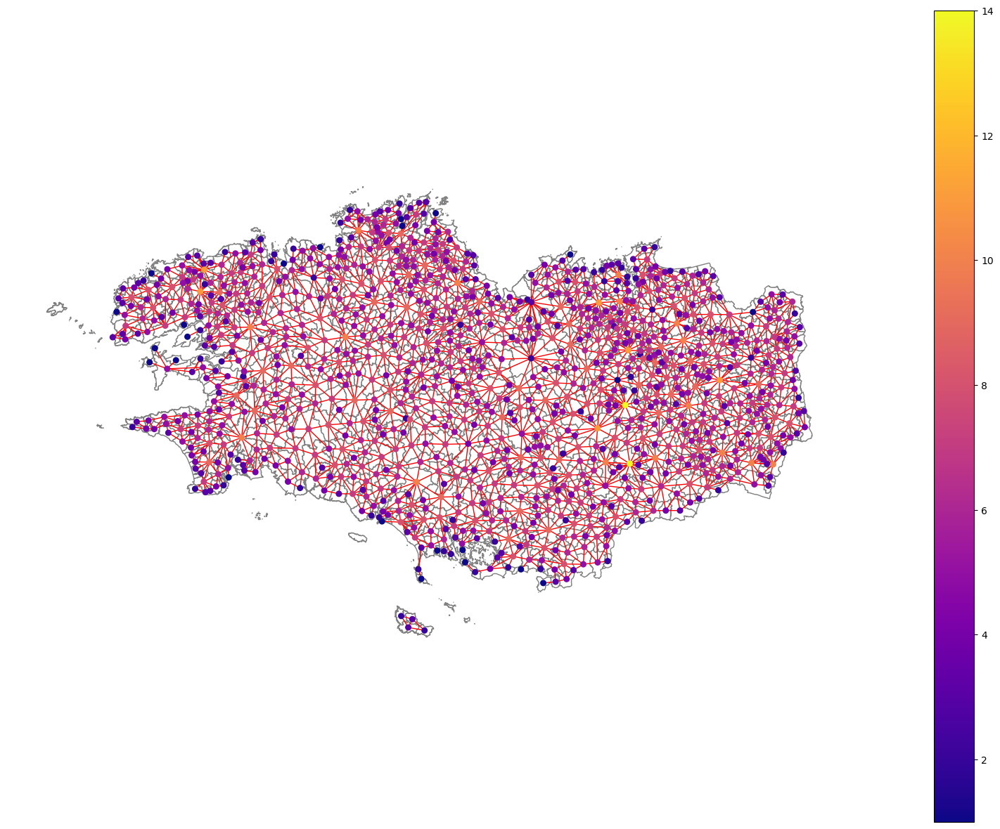

In [28]:
# Création d'une visualisation à partir des degrés des sommets du graphe

plt.close()
ax = region.plot(linewidth=1, edgecolor="grey", facecolor="white")
ax.axis("off")
cmap = plt.get_cmap('plasma')  # Choix de la colormap
nx.draw(G, cmap=cmap, pos=pos_insee, ax=ax,node_size=30, alpha=1, edge_color="r", node_color=tuple(degrees.values()))

norm = plt.Normalize(min(degrees.values()), max(degrees.values()))

sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
plt.colorbar(sm, ax=ax, orientation="vertical")

plt.show()

plt.close()

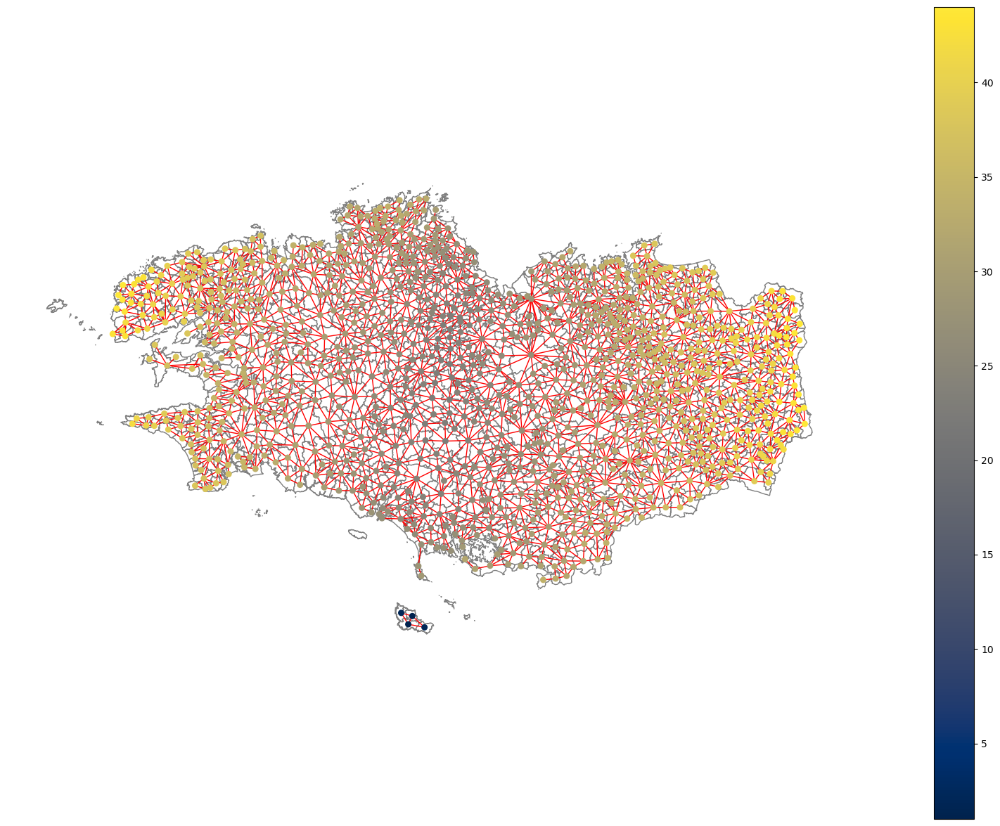

In [29]:
# Création d'une visualisation à partir de l'eccentricité des sommets du graphe

plt.close()
ax = region.plot(linewidth=1, edgecolor="grey", facecolor="white")
ax.axis("off")
cmap = plt.get_cmap('cividis')  # Choix de la colormap
nx.draw(G, cmap=cmap, pos=pos_insee, ax=ax,node_size=30, alpha=1, edge_color="r", node_color=tuple(eccentricities.values()))

norm = plt.Normalize(min(eccentricities.values()), max(eccentricities.values()))

sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
plt.colorbar(sm, ax=ax, orientation="vertical")

plt.show()

plt.close()

### 6. Scénarios proposés

####  Scénario 1 : La région Bretagne souhaiterait découvrir quelles sont les Y arrêtes les plus importantes de son réseau routier existant

***Pour ce scénario, nous avons besoin de :***

1. Identifier les Y arrêtes les plus importantes
2. Une commune X qui souhaite se visualiser autour de ces Y arrêtes

***Résultat attendu de ce scénario :***

Obtenir une carte indiquant les Y arrêtes les plus importantes du réseau routier existant et donc les routes à surveillées en prioritée pour la région Bretagne en supplémentaire de la visualisation de la commune X par rapport à ces Y arrêtes.

***Comment nous allons nous y prendre :***

1. Centralité d'intermédiarité (betweeness centrality) :
     - Cette centralité mesure le nombre de fois où un sommet agit comme un point de passage sur le plus court chemin entre deux autres sommets.
     - Plus ce nombre est élevé, plus l'arrête associée est importante.
     - Elle est donc utilisée pour trouver les Y arrêtes les plus importantes.

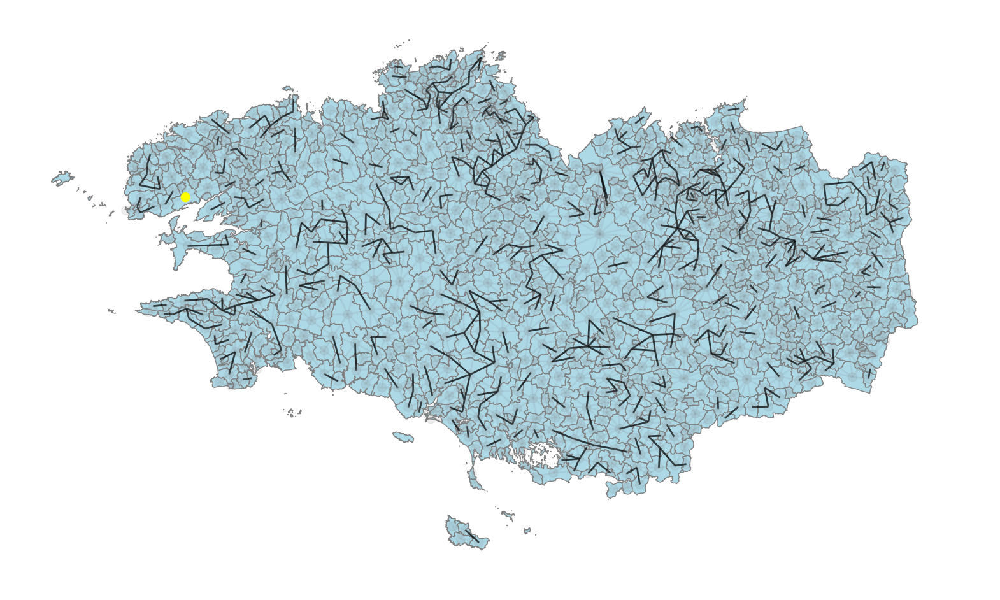

In [30]:
def draw_top_Y_arretes(G: nx.Graph, X: str, Y_amount: int) -> None:
    """
    Dessine un graphe représentant les Y arrêtes les plus importantes de la région de Bretagne
    :param G: un graphe NetworkX
    :param X: la commune que l'on souhaite voir avec les Y arrêtes les plus importantes
    :param Y_amount: la quantité d'arrêtes qu'on souhaite sélectionner
    :returns: None
    """
    new_G = nx.Graph()
    # remplissage des listes de couleurs et alpha associés à celles-ci pour les arrêtes
    edge_color_map = []
    edge_alpha_map = []
    # on récupère les Y arrêtes les plus importantes
    important_edges = arretes_importantes(G)[:Y_amount]
    # coloration de l'arrête en fonction de son importance (appartenant à Y ou non)
    for edge in G.edges():
        if edge in important_edges:
            new_G.add_edge(edge[0], edge[1])
            edge_color_map.append("black")
            edge_alpha_map.append(0.75)
        else:
            new_G.add_edge(edge[0], edge[1])
            edge_color_map.append("grey")
            edge_alpha_map.append(0.125)
    
    # remplissage des listes de couleurs et alpha associés à celles-ci pour les sommets
    node_color_map = []
    node_alpha_map = []
    for node in new_G:
        # si est le sommet X
        if node == X:
            node_color_map.append("yellow")
            node_alpha_map.append(1)
        # sinon
        else:
            node_color_map.append("grey")
            node_alpha_map.append(0.125)
    
    # on dessine le graphe
    region = geopandas.read_file("./DonneesFourniesGraphes/communes-geo.geojson")
    plt.close()
    ax = region.plot(linewidth=1, edgecolor="grey", facecolor="lightblue")
    ax.axis("off")
    nx.draw_networkx_nodes(new_G, node_color=node_color_map, pos=pos_insee, ax=ax, node_size=100, alpha=node_alpha_map)
    nx.draw_networkx_edges(new_G, edge_color=edge_color_map ,pos=pos_insee, ax=ax, width=2.0, alpha=edge_alpha_map)
    plt.show()

def arretes_importantes(G: nx.Graph) -> list:
    """
    Renvoie une liste triée par ordre décroissant de la centralité d'intermédiarité de chaque sommet du graphe
    :param G: un graphe NetworkX
    :returns: liste triée par odre décroissant de la centralité d'intermédiarité de chaque sommet du graphe
    """
    betweenness_centralities = nx.edge_betweenness_centrality(G)
    important_edges = sorted(betweenness_centralities, key=betweenness_centralities.get, reverse=True)
    return important_edges

# Exemple d'utilisation
top_Y = 500  # Nombre de d'arrêtes les plus importantes à trouver
commune_X = 29019 # Commune qui souhaite visualiser sur la carte
draw_top_Y_arretes(G, commune_X, top_Y)

####  Scénario 2 : Une commune X voudrait se lier aux Y communes les plus importantes de Bretagne par le biais d'un réseau routier spécialisé


***Pour ce scénario, nous avons besoin de :***

1. Identifier les Y communes les plus importantes
2. Trouver le chemin le plus court de la commune X à chacune de ces Y communes.

***Résultat attendu de ce scénario :***

Obtenir une carte des chemins à suivre pour relier efficacement la commune X aux communes Y

***Comment nous allons nous y prendre :***

1. Centralité de degré (degree centrality) :
     - Cette centralité mesure le nombre de voisins qu'une commune a.
     - Plus ce nombre est élevé, plus la commune est importante.
     - Elle est donc utilisée pour trouver les Y communes les plus importantes.
    
2. Chemin le plus court (shortest Path) :
    - Utilisation de l'algorithme de calcul du plus court chemin implémenté par NetworkX

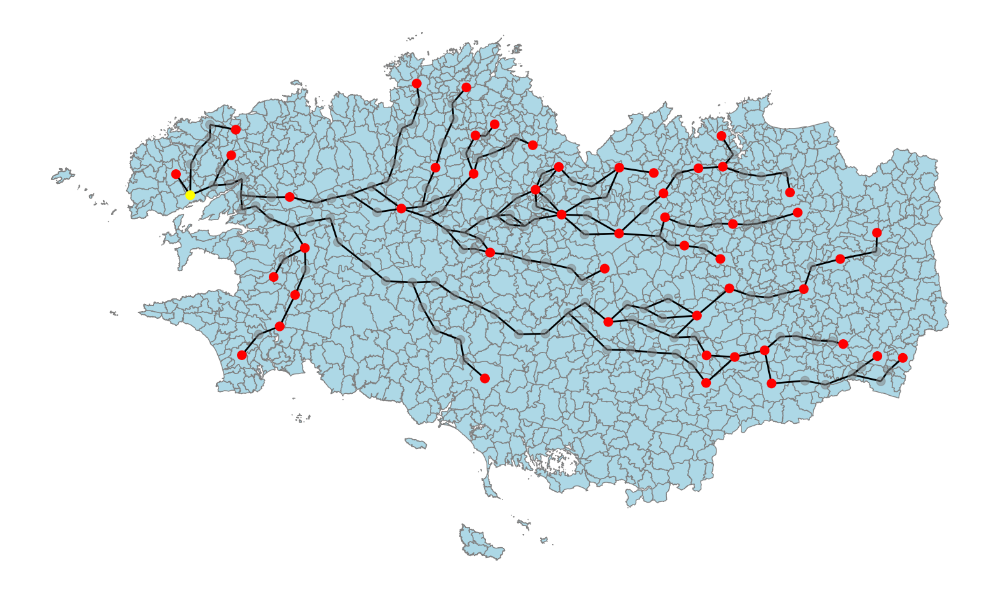

In [34]:
def draw_top_Y_communes(G: nx.Graph, X: str, amount_Y: int) -> None:
    """
    Dessine un graphe représentant les chemins reliant la commune X aux Y communes les plus importantes
    :param G: un graphe NetworkX
    :param X: la commune qu'on souhaite reliée aux Y communes les plus importantes
    :param amount_Y: la quantité de communes les plus importantes qu'on souhaite sélectionner
    :returns: None
    """
    new_G = nx.Graph()
    top_Y_communes = get_top_Y_communes(G, amount_Y)
    # ajout des chemins les plus courts
    for Y in top_Y_communes:
        shortest_path, shortest_distance = chemin_plus_court_de_X_vers_Y(G, X, Y)
        for i in range(len(shortest_path) - 1):
            new_G.add_edge(shortest_path[i], shortest_path[i + 1])
    
    # remplissage des listes de couleurs et alpha associés à celles-ci en fonction du sommet
    color_map = []
    alpha_map = []
    for node in new_G:
        # si est le sommet X
        if node == X:
            color_map.append('yellow')
            alpha_map.append(1)
        # si est l'un des sommets appartenant à top_Y_communes
        elif node in top_Y_communes:
            color_map.append('red')
            alpha_map.append(1)
        # sinon
        else:
            color_map.append('grey')
            alpha_map.append(0.50)

    # on dessine le graphe 
    region = geopandas.read_file("./DonneesFourniesGraphes/communes-geo.geojson")
    plt.close()
    ax = region.plot(linewidth=1, edgecolor="grey", facecolor="lightblue")
    ax.axis("off")
    nx.draw_networkx_nodes(new_G, node_color=color_map, pos=pos_insee, ax=ax, node_size=100, alpha=alpha_map)
    nx.draw_networkx_edges(new_G, edge_color="black", pos=pos_insee, ax=ax, width=2.0, alpha=1)
    plt.show()

def get_top_Y_communes(G: nx.Graph, amount_Y: int) -> list:
    """
    Renvoie une liste triée dans l'ordre décroissant de la centralité de degré de chaque sommet du graphe
    :param G: un graphe NetworkX
    :param amount_Y: la quantité de communes les plus importantes qu'on souhaite sélectionner
    :returns: une liste triée dans l'ordre décroissant de la centralité de degré et contenant les Y-ème premiers valeurs obtenues
    """
    degree_centralities = nx.degree_centrality(G)
    top_Y_communes = sorted(degree_centralities, key=degree_centralities.get, reverse=True)[:amount_Y]
    return top_Y_communes

def chemin_plus_court_de_X_vers_Y(G, commune_X, commune_Y):
    """
    Trouve le plus court chemin de X vers Y dans un graphe
    :param G: un graphe NetworkX
    :param commune_X: la commune de départ
    :param commune_Y: la commune d'arrivée
    :returns: les sommets composant le chemin le plus court entre X et Y ainsi que la distance de celui-ci
    """
    try:
        shortest_path = nx.shortest_path(G, source=commune_X, target=commune_Y)
        shortest_distance = nx.shortest_path_length(G, source=commune_X, target=commune_Y)
        return shortest_path, shortest_distance
    except nx.NetworkXNoPath:
        return None, float('inf')

# Exemple d'utilisation
top_Y = 50  # Nombre de communes les plus importantes à trouver
commune_X = 29019 # Commune qu'on souhaite relier à ces Y communes
draw_top_Y_communes(G, commune_X, top_Y)

#### Scénario 3 : La région Bretagne souhaiterait améliorer son réseau routier existant en prioritisant les Y communes les plus proches de gares

***Pour ce scénario, nous avons besoin de :***

1. Insérer l'un des fichier CSV fourni lors d'une des SAE précédente (gares.csv) dans DonneesFourniesGraphes
1. Obtenir un sous-graphe composé uniquement de communes ayant déjà une gare à l'aide de ce fichier
2. Identifier les Y communes à prioritisées (nécessairement non incluses dans le sous-graphe)

***Résultat attendu de ce scénario :***

Obtenir une carte des Y communes à prioritisées avec une indication quant à leur ordre de priorité (première: 1, dernière: Y)

***Comment nous allons nous y prendre :***

1. Sous-graphe :
    - Ce sous-graphe est composé des communes ayant déjà une gare.
    - La centralité de proximité des autres communes sera calculée à l'aide des communes de ce sous-graphe.
    - En effet, si ceci n'était pas effectué alors nous obtiendrons les communes ayant déjà des gares ce qui fausserait le résultat.
    
2. Centralité de proximité (proximity centrality) :
    - Cette centralité permet de déterminer la capacité d'un sommet à atteindre rapidement tous les autres sommets d'un graphe.
    - Plus ce nombre est élévé, plus la commune concernée est proche des autres communes.
    - Elle est donc utilisée pour trouver les Y communes à prioritisées en dehors de celles appartenant au sous-graphe.

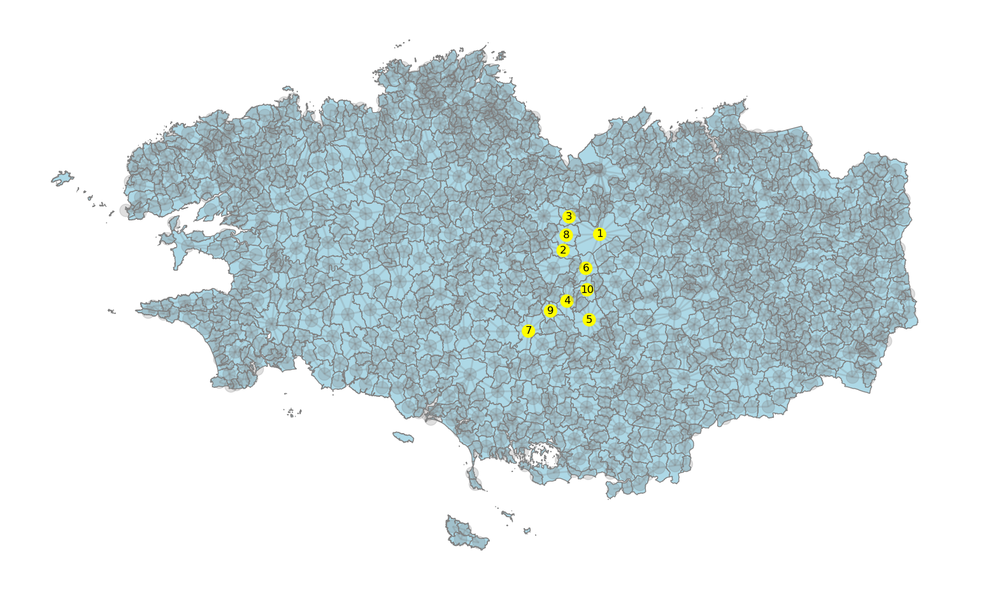

In [37]:
def draw_Y_highest_priority(G: nx.Graph, amount_Y: int, X: int = -1) -> None:
    """
    Dessine un graphe représentant les Y communes les plus importantes à prioritisées pour l'amélioration du réseau routier
    :param G: un graphe NetworkX
    :param amount_Y: la quantité de communes les plus importantes à prioritisées qu'on souhaite sélectionner
    :param X: valeur par défaut à -1, permettrait à un utilisateur de voir sa commune sur la carte si elle fait partie de top_Y_priority
    :returns: None
    """
    # Chargement du fichier gare.csv
    gares = pd.read_csv("./DonneesFourniesGraphes/gare.csv", sep=';')
    # Création du sous-graphe G_gares avec les communes ayant une gare
    communes_gares = set(gares['codeGare'].unique())
    G_gares = G.subgraph(communes_gares).copy()
    top_Y_priority = get_Y_highest_priority(G, G_gares, amount_Y)
    # création du nouveau graphe
    new_G = nx.Graph()
    for edge in G.edges():
        new_G.add_edge(edge[0], edge[1])
    
    # création d'une liste pour les ID
    top_Y_priority_ID = [ID for ID, _ in top_Y_priority]
    # création d'un dictionnaire pour le contenu des sommets
    top_Y_priority_content = dict()
    i = 1
    for ID, _ in top_Y_priority:
        top_Y_priority_content[ID] = i
        i = i + 1
    if X != -1:
        if X not in top_Y_priority_content.keys():
            top_Y_priority_content[X] = "?"

    # remplissage des listes de couleurs et alpha associés à celles-ci en fonction du sommet
    color_map = []
    alpha_map = []
    for node in new_G:
        if node == X:
            color_map.append('red')
            alpha_map.append(1)
        elif node in top_Y_priority_ID:
            color_map.append('yellow')
            alpha_map.append(1)
        # sinon
        else:
            color_map.append('grey')
            alpha_map.append(0.25)

    # on dessine le graphe 
    region = geopandas.read_file("./DonneesFourniesGraphes/communes-geo.geojson")
    plt.close()
    ax = region.plot(linewidth=1, edgecolor="grey", facecolor="lightblue")
    ax.axis("off")
    nx.draw_networkx_nodes(new_G, node_color=color_map, pos=pos_insee, ax=ax, node_size=200, alpha=alpha_map)
    nx.draw_networkx_edges(new_G, edge_color="grey", pos=pos_insee, ax=ax, width=2.0, alpha=0.25)
    nx.draw_networkx_labels(new_G, pos=pos_insee, labels=top_Y_priority_content)
    plt.show()
    
def get_Y_highest_priority(G: nx.Graph, sub_G: nx.Graph, amount_Y: int) -> list:
    """
    Renvoie la liste triée dans l'ordre décroissants des Y premières communes les plus importantes à prioritisées
    :param G: un graphe NetworkX
    :param sub_G: un sous-graphe NetworkX de G
    :param amount_Y: la quantité de communes les plus importantes à prioritisées qu'on souhaite sélectionner
    :returns: la liste triée dans l'ordre décroissants des Y premières communes les plus importantes à prioritisées
    """
    # Liste des communes dans sub_G
    communes_avec_gare = list(sub_G.nodes()) 
    # Liste des communes dans le graphe original G
    communes_total = list(G.nodes())
    # Communes à prioriser (communes dans G mais pas dans sub_G)
    communes_a_prioriser = [commune for commune in communes_total if commune not in communes_avec_gare]
    # Initialisation du dictionnaire pour stocker les centralités de proximité
    proximity_to_gares_prioriser = {}
    # Calcul de la centralité de proximité pour chaque commune à prioriser
    for commune in communes_a_prioriser:
            closeness = nx.closeness_centrality(G, u=commune, distance='weight')
            proximity_to_gares_prioriser[commune] = closeness
    # Trie des communes à prioriser par la centralité de proximité décroissante
    sorted_communes_prioriser = sorted(proximity_to_gares_prioriser.items(), key=lambda x: x[1], reverse=True)
    # Sélectionner les Y communes les plus prioritaires à afficher
    return sorted_communes_prioriser[:amount_Y]

# Exemple d'utilisation
top_Y = 10 # Nombre de communes les plus importantes à prioritisées
draw_Y_highest_priority(G, top_Y) # cas normal
# Retirer les commentaires si dessous pour un cas spécial (on souhaite voir une commune X parmi toutes les communes renvoyées)
# draw_Y_highest_priority(G, 1160, 29019) # test pour la comparaison visuelle d'une commune X sur la carte, contient une valeur ssi cette commune est dans top_Y_priority sinon la valeur est "?"
# draw_Y_highest_priority(G, 1, 29019) # exemple du résultat si X est en dehors de top_Y_priority

### 7. Section technique

##### Mise en place du fichier

Tout d'abord, nous avons commencé par comprendre les données qui nous ont été fournies.
Ainsi, nous avions remarqué que la méthode amezek(com) renvoyait des données erronées.
En effet, le nombre de voisins était toujours supérieur au nombre réel de voisins de un voisin à cause de la présence presque systématique de doublons renvoyés par la méthode. 
Nous avons réglé le problème en ajoutant une simple ligne de code qui vérifie si la valeur n'est pas déjà présente dans la liste renvoyée par la méthode amezek(com).

Ensuite, nous avons consulté notre cours ainsi que les TPs de R2.07 afin de mieux comprendre les programmes fournis.
De plus, nous avons consulté la documentation des bibliothèques utilisées afin de mieux les utilisées.

Nous avons continué dans notre lancée en écrivant les méthodes de la section 3 "Méthodes proposées" en s'inspirant des formules et valeurs utilisées en R2.07. 
Même si certaines ne sont pas utilisées, telles que les méthodes en rapport aux composantes connexes, elles nous ont été utiles lors du remplissage des sections 5 et 6 puisque les scénarios n'étaient pas encore effectués à ce moment là.

Enfin, nous avons déplacé l'ensemble des importations de bibliothèques dans une unique case de ce fichier et nous avons mis en place la variable d'environnement NETWORKX_AUTOMATIC_BACKENDS afin d'utiliser notre GPU lors du lancement des méthodes de la bibliothèque NetworkX ce qui diminue grandement le temps d'exécution de celles-ci.

##### Visualisations ad minima et scénarios
Une fois que la mise en place du fichier a été effectuée, nous sommes passé à la création des méthodes ad minima ainsi que la création des scénarios et des méthodes de résolution de ceux-ci. 
Pour les scénarios, notre objectif était d'utiliser les trois types de centralité découverts en R2.07.

##### Problèmes rencontrés
Lors de l'écriture de la section 3, nous nous sommes hurté au fait que la première méthode de calcul des excentricités des sommets d'un graphe, c'est-à-dire la méthode calculate_eccentricity1, utilisait l'algorithme de dijkstra implémenté par NetworkX . Or, il était attendu qu'on utilise un algorithme plus efficace que nous devions programmer nous-mêmes.
Nous avons alors tenter de créer une implémentation de l'algorithme A* puis nous sommes passer à la création de la méthode calculate_eccentricity2 qui utilise l'algorithme de parcours en largeur que nous avons implémenté nous-mêmes et qui se trouve être plus efficace que dijkstra et A* dans notre cas.
Cependant, ceci est difficile à voir puisque nous utilisons notre GPU pour les méthodes de NetworkX et non pas pour la méthode de parcours en largeur que nous avons programmée.

Lors de la création du troisième scénario, nous nous sommes hurté au fait qu'aucun des fichiers CSV fournis contient des données concernant les communes ayant une gare. 
Nous avons alors pris la liberté d'ajouter le fichier gare.csv au répertoire DonneesFourniesGraphes afin de créer le sous-graphe adéquat au scénario. Il faut savoir que ce fichier est l'un des fichiers fournis lors de la création de notre base de données et contient donc des données légitimes utilisées par notre application.

##### Le futur de nos méthodes et visualisations
Les méthodes programmées et nottament les méthodes programmées dans le cadre des scénarios seront utilisées dans notre application finale afin que l'utilisateur puisse visualiser et exporter les graphes créés pour la commune et autres paramètres de son choix. Il sera donc possible de recréer les visualisations que nous avons obtenues sur ce document.